In [1]:
# Adapted from M.X. Cohen

import numpy as np
import math
import matplotlib.pyplot as plt
import random
import timeit
import scipy.fftpack
import scipy.io as sio
from scipy import stats
from scipy import signal
from scipy import interpolate
from PIL import Image
from skimage import filters
import scipy.ndimage as ndimage
import scipy
import imageio
from skimage.morphology import disk

# Google Sheets Link

https://docs.google.com/document/d/1ZRc-jSjPBN2ZQVElUd9T-Lfzk6sQjUbP3qRj14w4L9Q/edit?ts=5e8cc5e4

# Test SLIC with entire image

In [54]:
import numpy as np

from fast_slic import Slic
from PIL import Image


img = np.asarray(Image.open("../data/nc4.jpg"))
# import cv2; image = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)   # You can convert the image to CIELAB space if you need.
slic = Slic(num_components= 20000, compactness=10)
assignment = slic.iterate(img) # Cluster Map
print(assignment)
print(slic.slic_model.clusters) # The cluster information of superpixels.






[[    0     0     0 ...   137   137   137]
 [    0     0     0 ...   137   137   137]
 [    0     0     0 ...   137   137   137]
 ...
 [19326 19326 19326 ... 19280 19280 19280]
 [19326 19326 19326 ... 19280 19280 19280]
 [19326 19326 19326 ... 19280 19280 19280]]
[{'number': 0, 'yx': (15.0, 8.0), 'color': (200.0, 128.0, 128.0), 'num_members': 187}, {'number': 1, 'yx': (15.0, 25.0), 'color': (200.0, 128.0, 128.0), 'num_members': 187}, {'number': 2, 'yx': (15.0, 42.0), 'color': (200.0, 128.0, 128.0), 'num_members': 187}, {'number': 3, 'yx': (15.0, 59.0), 'color': (200.0, 128.0, 128.0), 'num_members': 187}, {'number': 4, 'yx': (15.0, 76.0), 'color': (200.0, 128.0, 128.0), 'num_members': 187}, {'number': 5, 'yx': (15.0, 93.0), 'color': (200.0, 128.0, 128.0), 'num_members': 195}, {'number': 6, 'yx': (13.0, 111.0), 'color': (200.0, 128.0, 128.0), 'num_members': 170}, {'number': 7, 'yx': (12.0, 128.0), 'color': (200.0, 128.0, 128.0), 'num_members': 144}, {'number': 8, 'yx': (14.0, 144.0), 'co

1932


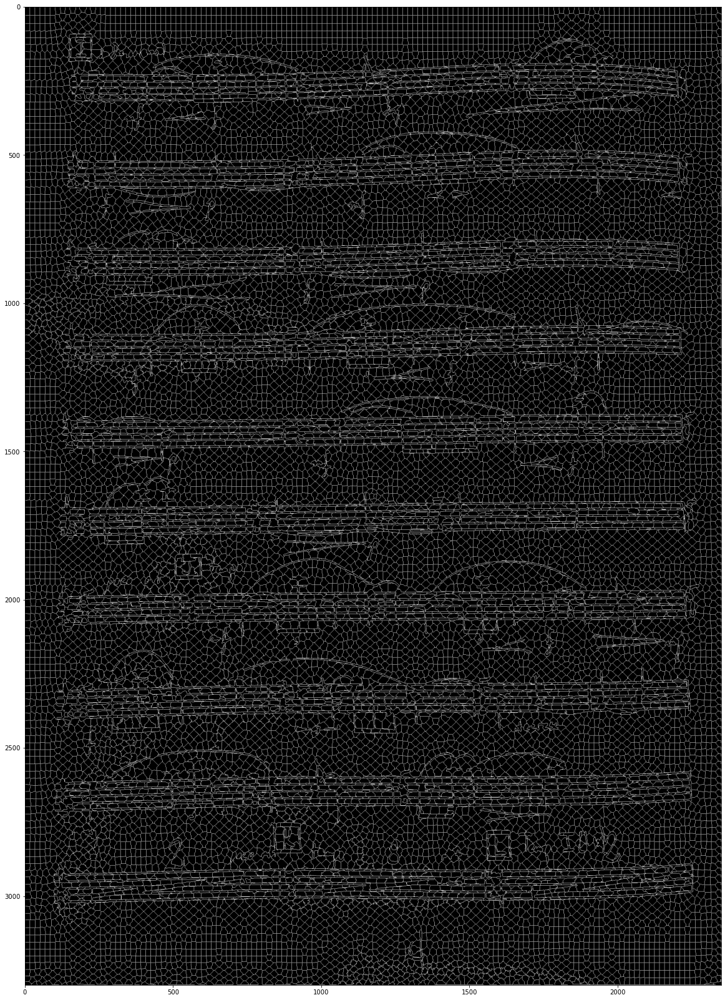

In [55]:
plt.figure(figsize=(20,30))



assignment = ndimage.laplace(assignment)
maximum = np.max(assignment)
print(maximum)
#print(minimum)
val = filters.threshold_otsu(assignment)
assignment[assignment < 0] = 0
assignment[assignment > 0] = 255
plt.imshow(assignment, cmap='gray')

In [59]:
imageio.imwrite("../data/slicc_20000.png", assignment)

Lossy conversion from int16 to uint8. Range [0, 255]. Convert image to uint8 prior to saving to suppress this warning.


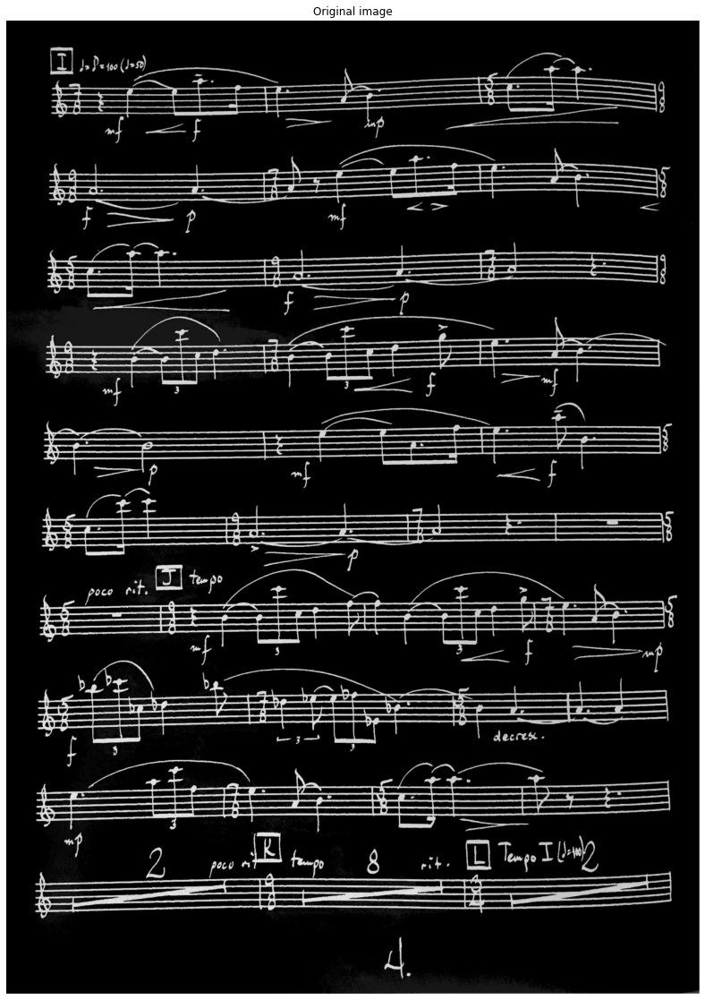

In [56]:
music = np.asarray(Image.open("../data/nc4.jpg"))
red = music[..., 0]
green = music[..., 1]
blue = music[..., 2]

music = 0.21 * red + 0.72 * green + 0.07 * blue
music = ~(music.astype(np.uint8))

# plot original image
plt.figure(figsize=(30, 20))
plt.imshow(music, cmap=plt.cm.gray)
plt.axis('off')
plt.title('Original image')

plt.show()



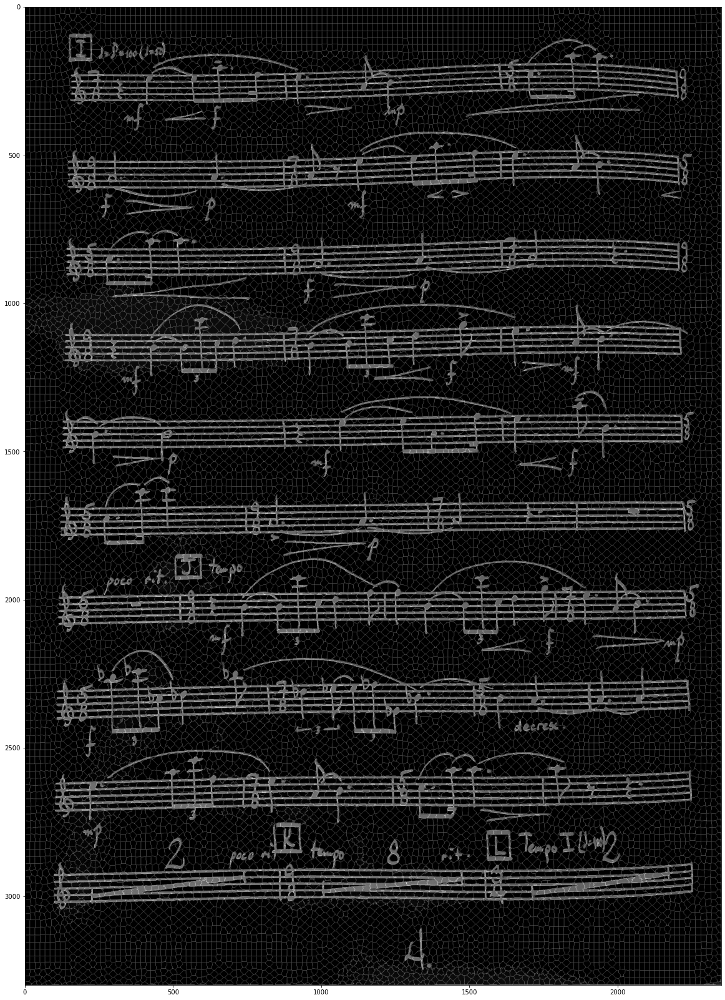

In [57]:
plt.figure(figsize=(20,30))
plt.imshow(music+assignment, cmap = 'gray')

In [60]:
imageio.imwrite("../data/slicc_20000_img.png", assignment+music)

Lossy conversion from int16 to uint8. Range [1, 509]. Convert image to uint8 prior to saving to suppress this warning.


# Test SLIC with segmented image

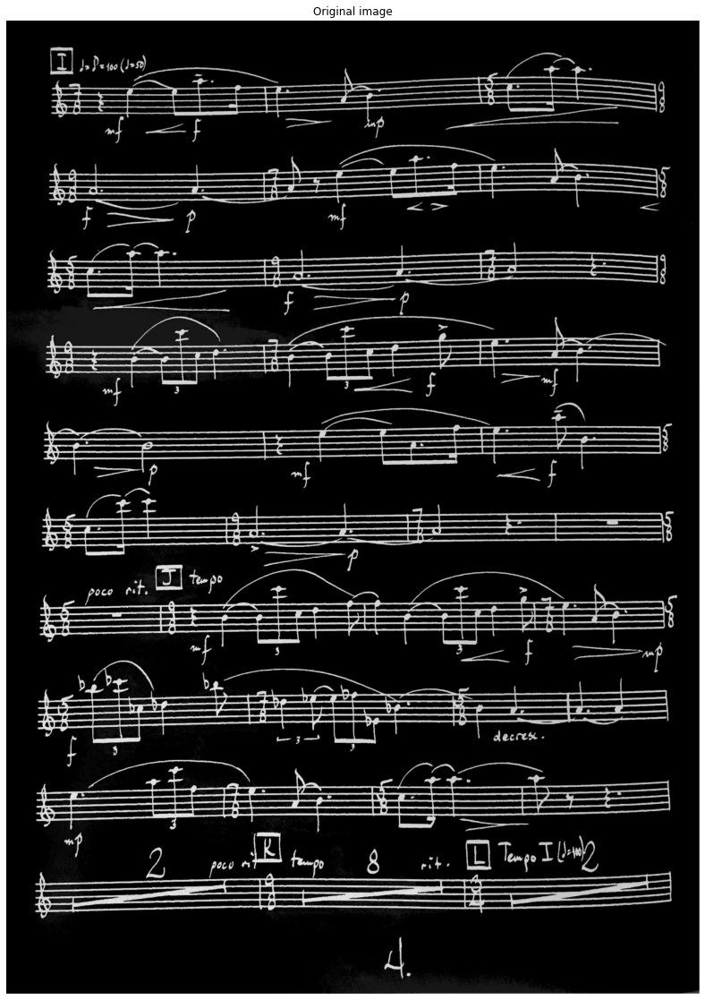

(-0.5, 2349.5, 3299.5, -0.5)

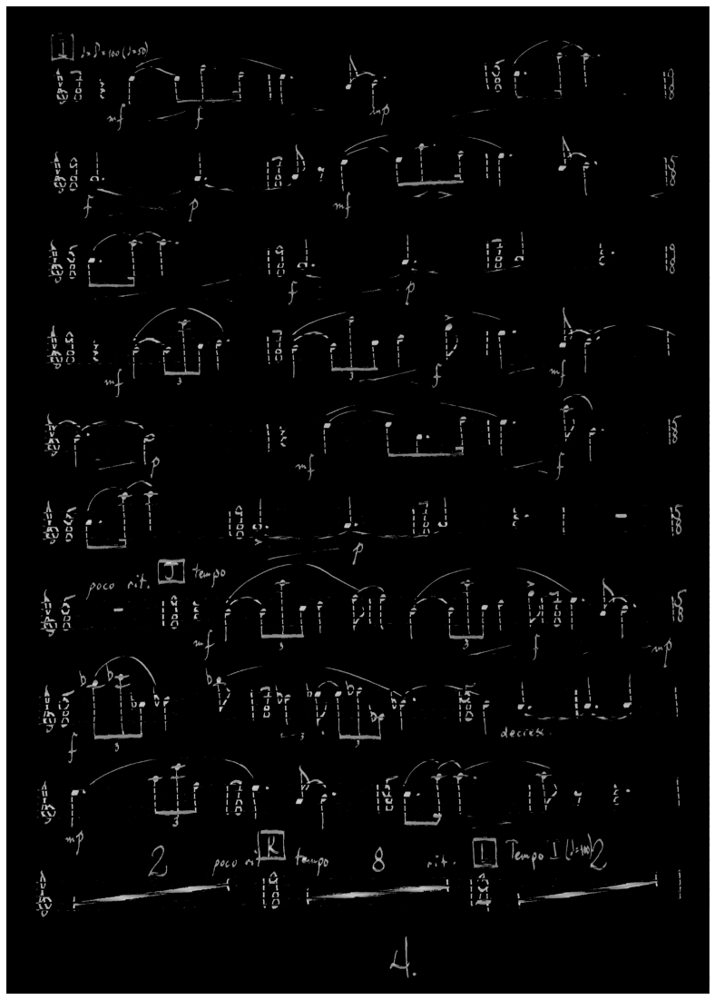

In [25]:
test_notes9=scipy.fftpack.fftshift(scipy.fftpack.fft2(music))
test_notes9[0:1525, 1150:1210]=0
test_notes9[1765: 3300-1, 1150:1210]=0


#test5[2000:3300-1, 1150: 1210]=0
#plt.figure(figsize=(30, 20))
#plt.imshow(np.log(np.abs(test_notes9)))

notes9 = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((test_notes9))))
#plt.figure(figsize=(30, 20))
thresh_note9=150
notes9[notes9 < thresh_note9]=0
plt.figure(figsize=(30, 20))
plt.imshow(notes9, cmap=plt.cm.gray)
plt.axis('off')


In [26]:
rgbmusic = np.zeros((music.shape[0], music.shape[1], 3))
imgblank = np.zeros(music.shape)
rgbmusic[0:music.shape[0], 0:music.shape[1], 0]=notes9
rgbmusic[0:music.shape[0], 0:music.shape[1], 1]=imgblank
rgbmusic[0:music.shape[0], 0:music.shape[1], 2]=imgblank
rgbmusic = rgbmusic.astype(np.uint8)

In [49]:
slic = Slic(num_components=15000, compactness=10)
assignment = slic.iterate(rgbmusic) # Cluster Map
print(assignment)
print(slic.slic_model.clusters) # The cluster information of superpixels.


[[    0     0     0 ...   116   116   116]
 [    0     0     0 ...   116   116   116]
 [    0     0     0 ...   116   116   116]
 ...
 [12922 12922 12922 ... 12935 12935 12935]
 [12922 12922 12922 ... 12935 12935 12935]
 [12922 12922 12922 ... 12935 12935 12935]]
[{'number': 0, 'yx': (12.0, 10.0), 'color': (0.0, 128.0, 128.0), 'num_members': 208}, {'number': 1, 'yx': (17.0, 32.0), 'color': (0.0, 128.0, 128.0), 'num_members': 239}, {'number': 2, 'yx': (17.0, 52.0), 'color': (0.0, 128.0, 128.0), 'num_members': 250}, {'number': 3, 'yx': (14.0, 73.0), 'color': (0.0, 128.0, 128.0), 'num_members': 232}, {'number': 4, 'yx': (17.0, 94.0), 'color': (0.0, 128.0, 128.0), 'num_members': 238}, {'number': 5, 'yx': (16.0, 113.0), 'color': (0.0, 128.0, 128.0), 'num_members': 223}, {'number': 6, 'yx': (10.0, 133.0), 'color': (0.0, 128.0, 128.0), 'num_members': 181}, {'number': 7, 'yx': (20.0, 152.0), 'color': (0.0, 128.0, 128.0), 'num_members': 232}, {'number': 8, 'yx': (13.0, 171.0), 'color': (0.0, 12

784


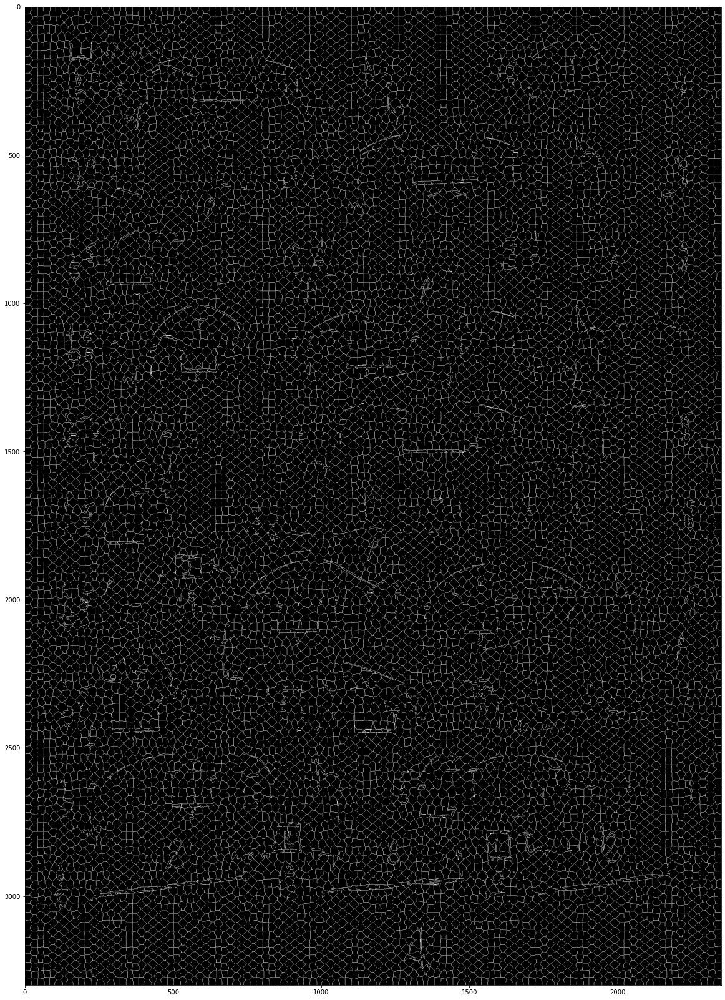

In [50]:

assignment = ndimage.laplace(assignment)
maximum = np.max(assignment)
print(maximum)
#print(minimum)
val = filters.threshold_otsu(assignment)
assignment[assignment < 0] = 0
assignment[assignment > 0] = 255
plt.figure(figsize=(20,30))
plt.imshow(assignment, cmap='gray')

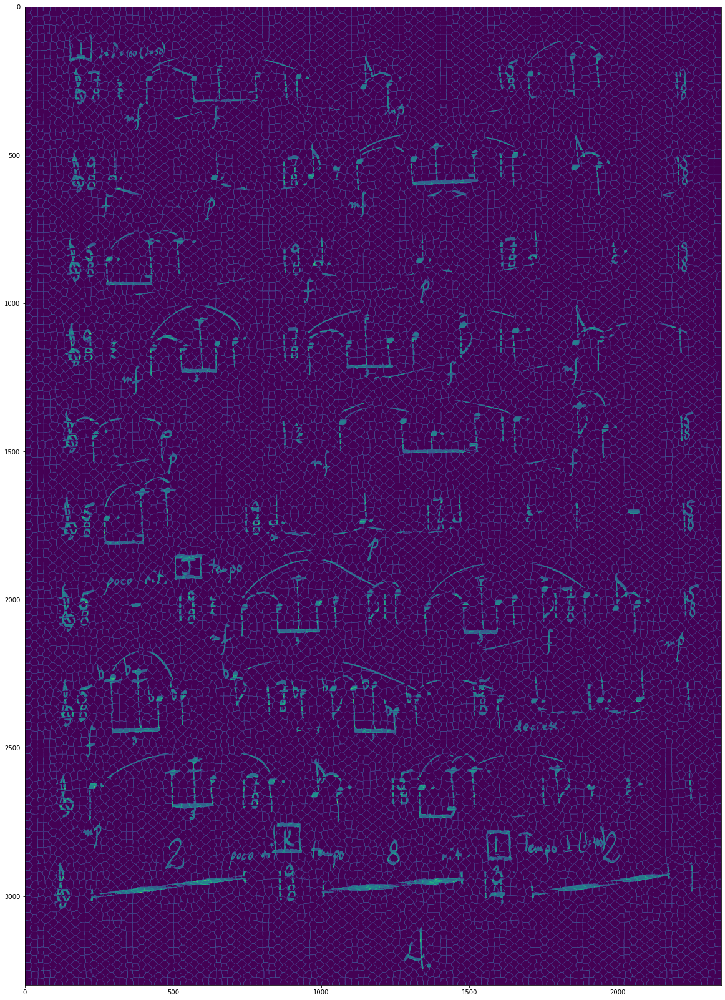

In [51]:
plt.figure(figsize=(20,30))
plt.imshow(assignment+notes9)